In [11]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from sklearn.cluster import KMeans
from sklearn.utils import shuffle
import pandas as pd
import seaborn as sns

import warnings
warnings.filterwarnings("ignore")

In [14]:
data = pd.read_csv('data/UCI_Credit_Card.csv', sep=',')
X=np.array(data.iloc[:,1:18])

print(X.shape)

(30000, 17)


In [3]:
print(X[0])

[2.000e+04 2.000e+00 2.000e+00 1.000e+00 2.400e+01 2.000e+00 2.000e+00
 0.000e+00 0.000e+00 0.000e+00 0.000e+00 3.913e+03 3.102e+03 6.890e+02
 0.000e+00 0.000e+00 0.000e+00]


In [4]:
data.head()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6
0,1,20000.0,2,2,1,24,2,2,0,0,0,0,3913,3102,689,0,0,0
1,2,120000.0,2,2,2,26,0,2,0,0,0,2,2682,1725,2682,3272,3455,3261
2,3,90000.0,2,2,2,34,0,0,0,0,0,0,29239,14027,13559,14331,14948,15549
3,4,50000.0,2,2,1,37,0,0,0,0,0,0,46990,48233,49291,28314,28959,29547
4,5,50000.0,1,2,1,57,0,0,0,0,0,0,8617,5670,35835,20940,19146,19131


<Figure size 640x480 with 0 Axes>

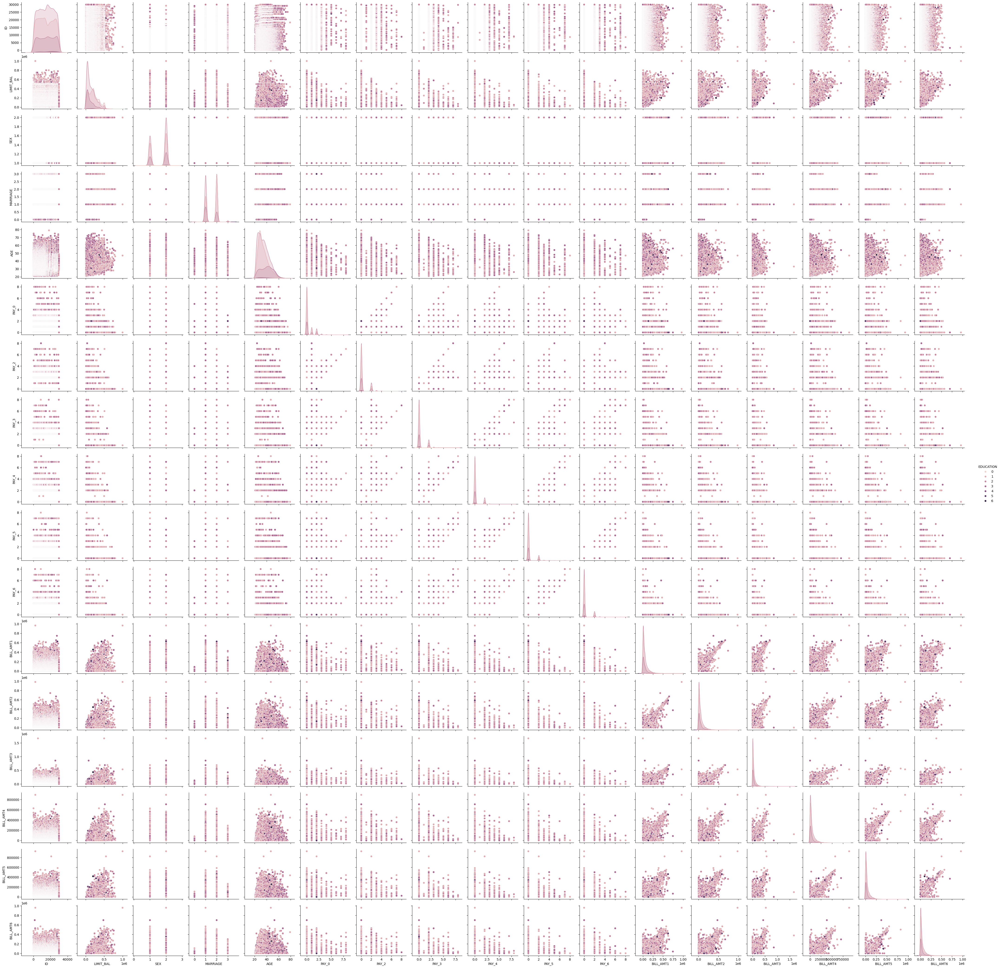

In [5]:
plt.figure(1)
sns.pairplot(data, hue='EDUCATION')
plt.show()

np.random.seed(1)
n = 6

kmeans_ = KMeans(n_clusters=n, init='random')
kmeans_.fit(X)

yhat = kmeans_.predict(X)

for i in range(n):
    print('Cluster %d: %d' % (i, sum(yhat==i)))
    fila = np.where(yhat==i)[0]
    num = fila.shape[0]
    r = int(np.floor(num/10))

    print('Cluster ', str(i))
    print(str(num), ' elementos')
    
    for j in range(num):
        plt.subplot(r+1, 10, j+1)
        plt.imshow(np.reshape(X[fila[j], :], (17,1)), cmap='gray')
        plt.axis('off')
    plt.show()

<Figure size 640x480 with 0 Axes>

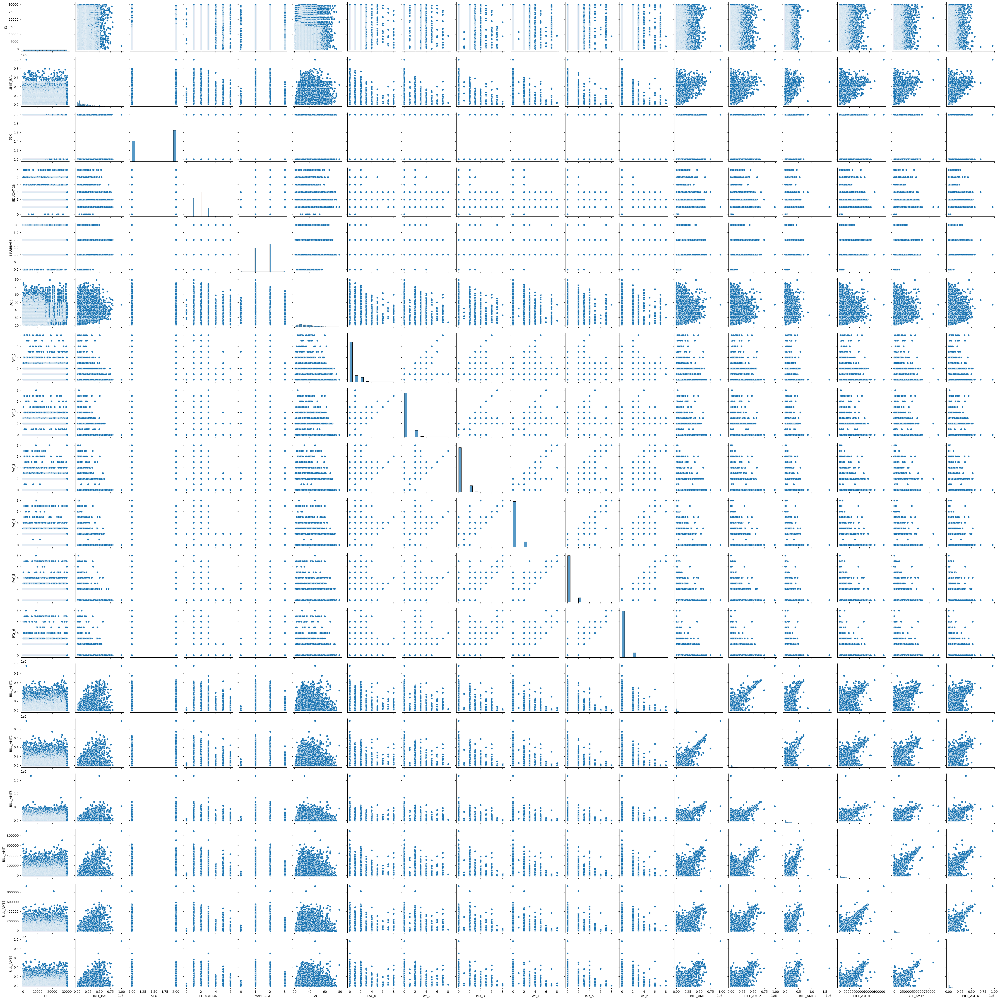

In [8]:
plt.figure(2)
sns.pairplot(data)
plt.show()

In [12]:
def elbow_method(X, max_clusters=10):
    """
    Aplica el método del codo para seleccionar el número óptimo de clusters en k-means.

    Parámetros:
    ----------
    X : matriz o matriz dispersa, forma (n_samples, n_features)
        Los datos de entrada.

    max_clusters : int, opcional (por defecto=10)
        El número máximo de clusters a considerar.
    """

    sum_of_squared_distances = []

    for k in range(1, max_clusters+1):
        kmeans = KMeans(n_clusters=k)
        kmeans.fit(X)
        sum_of_squared_distances.append(kmeans.inertia_)

    # Graficar la curva del codo
    plt.plot(range(1, max_clusters+1), sum_of_squared_distances, 'bx-')
    plt.xlabel('Número de Clusters (k)')
    plt.ylabel('Suma de las Distancias al Cuadrado')
    plt.title('Curva del Codo')
    plt.show()

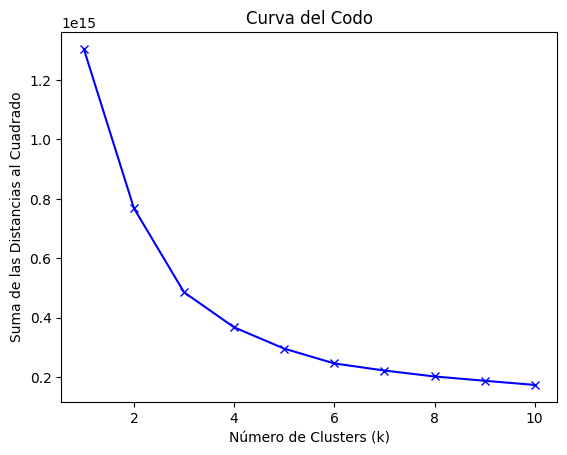

In [16]:
x=elbow_method(X, max_clusters=10)

Cluster 0: 3667
Cluster  0
3667  elementos


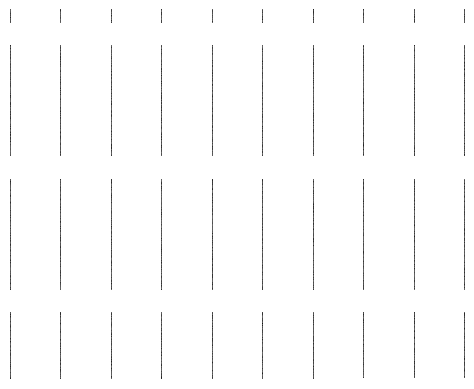

Cluster 1: 18117
Cluster  1
18117  elementos


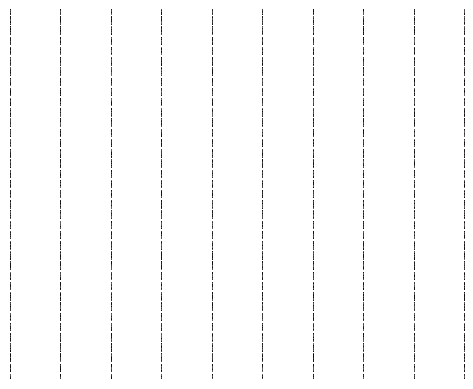

Cluster 2: 8216
Cluster  2
8216  elementos


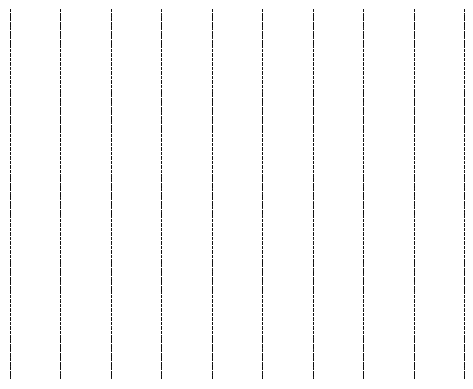

In [17]:
#seran 3 clusters
n=3

kmeans_ = KMeans(n_clusters=n, init='random')
kmeans_.fit(X)

yhat = kmeans_.predict(X)

for i in range(n):
    print('Cluster %d: %d' % (i, sum(yhat==i)))
    fila = np.where(yhat==i)[0]
    num = fila.shape[0]
    r = int(np.floor(num/10))

    print('Cluster ', str(i))
    print(str(num), ' elementos')
    
    #for j in range(num):
    #    plt.subplot(r+1, 10, j+1)
    #    plt.imshow(np.reshape(X[fila[j], :], (17,1)), cmap='gray')
    #    plt.axis('off')
    #plt.show()

labels = kmeans_.labels_
plt.figure()
sns.scatterplot(x='BILL_AMT1', y='BILL_AMT2', hue='Cluster', data=X, palette='viridis')
sns.scatterplot(x=kmeans_.cluster_centers_[:,0], y=kmeans_.cluster_centers_[:,1], color='black', marker='x')
plt.xlabel('BILL_AMT1')
plt.ylabel('BILL_AMT2')
plt.title('Clusters de los datos')
plt.show()

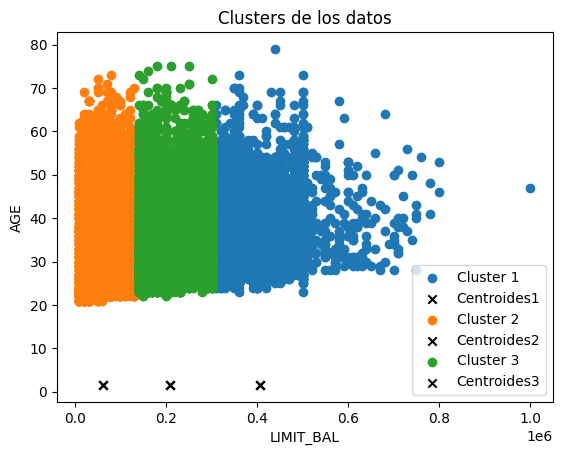

In [67]:
labels = kmeans_.labels_

fig, ax = plt.subplots()
for i in range(3):
    ax.scatter(X[yhat==i,0], X[labels==i,4], label='Cluster '+str(i+1))
    ax.scatter(kmeans_.cluster_centers_[:,0], kmeans_.cluster_centers_[:,1], color='black', marker='x', label='Centroides'+str(i+1))
ax.legend()
plt.xlabel('LIMIT_BAL')
plt.ylabel('AGE')
plt.title('Clusters de los datos')
plt.show()

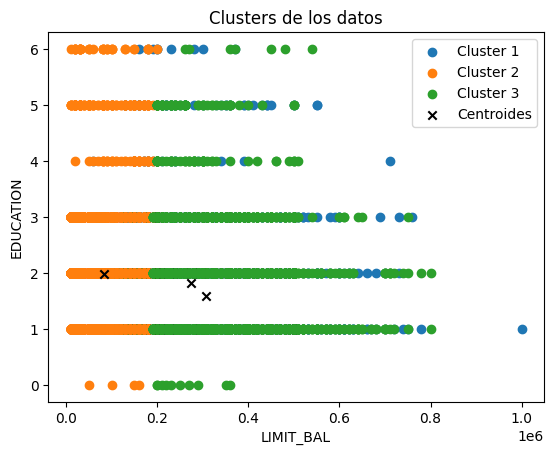

In [48]:
fig, ax = plt.subplots()
for i in range(3):
    ax.scatter(X[yhat==i,0], X[labels==i,2], label='Cluster '+str(i+1))

ax.scatter(kmeans_.cluster_centers_[:,0], kmeans_.cluster_centers_[:,2], color='black', marker='x', label='Centroides')
ax.legend()
plt.xlabel('LIMIT_BAL')
plt.ylabel('EDUCATION')
plt.title('Clusters de los datos')
plt.show()

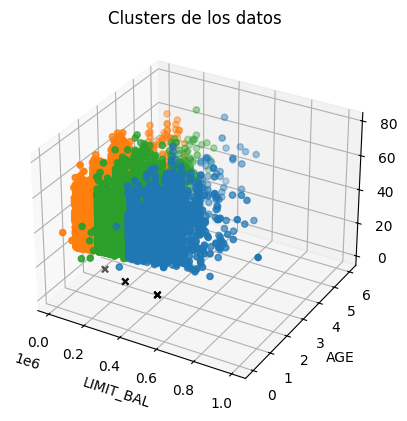

In [69]:
az = plt.axes(projection='3d')
for i in range(3):
    az.scatter3D(X[yhat==i,0], X[yhat==i,2], X[yhat==i,4], label='Cluster '+str(i+1))
    az.scatter(kmeans_.cluster_centers_[:,0], kmeans_.cluster_centers_[:,2], color='black', marker='x', label='Centroides')
ax.legend()
plt.xlabel('LIMIT_BAL')
plt.ylabel('AGE')
#ax.set_zlabel('EDUCATION')
plt.title('Clusters de los datos')
plt.show()

In [13]:
data2 = pd.read_csv('data/UCI_Credit_Card_2.csv', sep=',')
X2=np.array(data2.iloc[:,1:7])

print(X2.shape)

(30000, 6)


plt.figure(2)
sns.pairplot(X2)
plt.show()

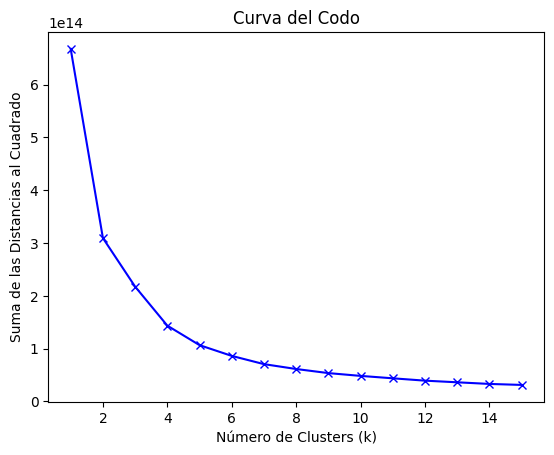

In [14]:
x=elbow_method(X2, max_clusters=15)

In [15]:
n2=3

kmeans_2 = KMeans(n_clusters=n2, init='random',n_init=30,tol=1e-015, max_iter=10000, algorithm='elkan')
kmeans_2.fit(X2)

yhat2 = kmeans_2.predict(X2)

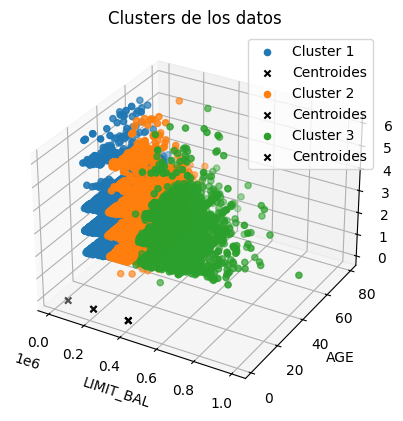

In [16]:
az = plt.axes(projection='3d')
for i in range(n2):
    az.scatter3D(X2[yhat2==i,0], X2[yhat2==i,4], X2[yhat2==i,2], label='Cluster '+str(i+1))
    az.scatter(kmeans_2.cluster_centers_[:,0], kmeans_2.cluster_centers_[:,2], color='black', marker='x', label='Centroides')
az.legend()
plt.xlabel('LIMIT_BAL')
plt.ylabel('AGE')
#ax.set_zlabel('EDUCATION')
plt.title('Clusters de los datos')
plt.show()

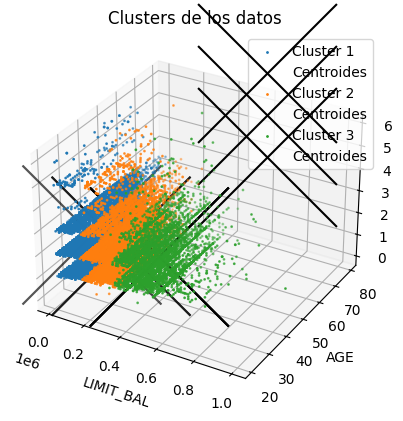

In [24]:
az = plt.axes(projection='3d')
for i in range(3):
    az.scatter3D(X2[yhat2==i,0], X2[yhat2==i,4], X2[yhat2==i,2], label='Cluster '+str(i+1), zorder=1, s=1,)
    az.scatter3D(kmeans_2.cluster_centers_[:,0], kmeans_2.cluster_centers_[:,4], kmeans_2.cluster_centers_[:,2], color='black', marker='x', label='Centroides',s=10000, zorder=50000)
az.legend()
plt.xlabel('LIMIT_BAL')
plt.ylabel('AGE')
#ax.set_zlabel('EDUCATION')
plt.title('Clusters de los datos')
plt.show()

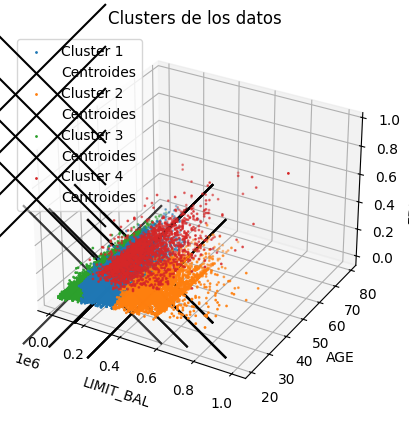

In [41]:
n3=4

kmeans_3 = KMeans(n_clusters=n3, init='random',n_init=30,tol=1e-015, max_iter=10000, algorithm='elkan')
kmeans_3.fit(X2)

yhat3 = kmeans_3.predict(X2)

az1 = plt.axes(projection='3d')
for i in range(n3):
    az1.scatter3D(X2[yhat3==i,0], X2[yhat3==i,4], X2[yhat3==i,5], label='Cluster '+str(i+1), zorder=1, s=1,)
    az1.scatter3D(kmeans_3.cluster_centers_[:,0], kmeans_3.cluster_centers_[:,4], kmeans_3.cluster_centers_[:,5], color='black', marker='x', label='Centroides',s=10000, zorder=5)
az1.legend()
plt.xlabel('LIMIT_BAL')
plt.ylabel('AGE')
az1.set_zlabel('EDUCATION')
plt.title('Clusters de los datos')
plt.show()